In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import json
import bz2
import os
import random
from tqdm import trange
import matplotlib
from scipy.integrate import odeint
from scipy.ndimage import gaussian_filter1d

In [2]:
dir_f='/home/vahid/Downloads/RKI_COVID19.csv'
age_classes=['A00-A04','A05-A14','A15-A34','A35-A59','A60-A79','A80+']
age_rate=[4./100., 9./100., 23./100., 35./100.,22./100.,7./100.]
sex_classes=['W','M']
sex_rate=[51./100.,49./100]

In [3]:
data_raw=pd.read_csv(dir_f)

In [4]:
data_raw

,ObjectId,IdBundesland,Bundesland,Landkreis,Altersgruppe,Geschlecht,AnzahlFall,AnzahlTodesfall,Meldedatum,IdLandkreis,Datenstand,NeuerFall,NeuerTodesfall,Refdatum,NeuGenesen,AnzahlGenesen,IstErkrankungsbeginn,Altersgruppe2
0,1,1,Schleswig-Holstein,SK Flensburg,A00-A04,M,1,0,2020/09/30 00:00:00+00,1001,"24.03.2021, 00:00 Uhr",0,-9,2020/09/30 00:00:00+00,0,1,0,Nicht übermittelt
1,2,1,Schleswig-Holstein,SK Flensburg,A00-A04,M,1,0,2020/10/29 00:00:00+00,1001,"24.03.2021, 00:00 Uhr",0,-9,2020/10/29 00:00:00+00,0,1,0,Nicht übermittelt
2,3,1,Schleswig-Holstein,SK Flensburg,A00-A04,M,1,0,2020/11/03 00:00:00+00,1001,"24.03.2021, 00:00 Uhr",0,-9,2020/11/03 00:00:00+00,0,1,0,Nicht übermittelt
3,4,1,Schleswig-Holstein,SK Flensburg,A00-A04,M,1,0,2020/11/20 00:00:00+00,1001,"24.03.2021, 00:00 Uhr",0,-9,2020/11/19 00:00:00+00,0,1,1,Nicht übermittelt
4,5,1,Schleswig-Holstein,SK Flensburg,A00-A04,M,1,0,2020/11/23 00:00:00+00,1001,"24.03.2021, 00:00 Uhr",0,-9,2020/11/18 00:00:00+00,0,1,1,Nicht übermittelt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1471037,1471038,16,Thüringen,LK Altenburger Land,A80+,W,1,0,2021/03/16 00:00:00+00,16077,"24.03.2021, 00:00 Uhr",0,-9,2021/03/16 00:00:00+00,-9,0,0,Nicht übermittelt
1471038,1471039,16,Thüringen,LK Altenburger Land,A80+,W,1,0,2021/03/18 00:00:00+00,16077,"24.03.2021, 00:00 Uhr",0,-9,2021/03/18 00:00:00+00,-9,0,0,Nicht übermittelt
1471039,1471040,16,Thüringen,LK Altenburger Land,A80+,W,2,0,2021/03/20 00:00:00+00,16077,"24.03.2021, 00:00 Uhr",0,-9,2021/03/20 00:00:00+00,-9,0,0,Nicht übermittelt
1471040,1471041,16,Thüringen,LK Altenburger Land,A80+,W,1,0,2021/03/22 00:00:00+00,16077,"24.03.2021, 00:00 Uhr",1,-9,2021/03/22 00:00:00+00,-9,0,0,Nicht übermittelt


In [5]:
melde_dus=np.sort(np.unique(data_raw.Meldedatum.values))

In [6]:
def get_S_I_R(age_rate,sex_rate,melde_dus):
    w_s_recovery=14
    
    infected=[]
    recovered=[]
    dead=[]

    infected_age=[]
    recovered_age=[]
    dead_age=[]
    
    infected_sex=[]
    recovered_sex=[]
    dead_sex=[]

    for data_ind in melde_dus:
        data_patch=data_raw[data_raw.Meldedatum==data_ind]

        data_rec_01=data_patch[(data_patch.NeuGenesen==0) | (data_patch.NeuGenesen==1)]
        data_rec_1n1=data_patch[(data_patch.NeuGenesen==-1) | (data_patch.NeuGenesen==1)]
        recovered.append( np.sum( data_rec_01.AnzahlGenesen.values)-np.sum( data_rec_1n1.AnzahlGenesen.values)  )

        data_inf_01=data_patch[(data_patch.NeuerFall==0) | (data_patch.NeuerFall==1)]
        data_inf_1n1=data_patch[(data_patch.NeuerFall==-1) | (data_patch.NeuerFall==1)]
        infected.append(np.sum( data_inf_01.AnzahlFall.values)-np.sum( data_inf_1n1.AnzahlFall.values))
        
        data_dead_01=data_patch[(data_patch.NeuerTodesfall==0) | (data_patch.NeuerTodesfall==1)]
        data_dead_1n1=data_patch[(data_patch.NeuerTodesfall==-1) | (data_patch.NeuerTodesfall==1)]
        dead.append(np.sum( data_inf_01.AnzahlTodesfall.values)-np.sum( data_inf_1n1.AnzahlTodesfall.values))

        infected_age_in=[]
        recovered_age_in=[]
        dead_age_in=[]
        for ag_c in age_classes:
            data_patch_age=data_patch[data_patch.Altersgruppe==ag_c]
            data_rec_01=data_patch_age[(data_patch_age.NeuGenesen==0) | (data_patch_age.NeuGenesen==1) ]
            data_rec_1n1=data_patch_age[(data_patch_age.NeuGenesen==-1) | (data_patch_age.NeuGenesen==1) ]

            data_inf_01=data_patch_age[(data_patch_age.NeuerFall==0) | (data_patch_age.NeuerFall==1) ]
            data_inf_1n1=data_patch_age[(data_patch_age.NeuerFall==-1) | (data_patch_age.NeuerFall==1) ]

            data_dead_01=data_patch_age[(data_patch_age.NeuerTodesfall==0) | (data_patch_age.NeuerTodesfall==1) ]
            data_dead_1n1=data_patch_age[(data_patch_age.NeuerTodesfall==-1) | (data_patch_age.NeuerTodesfall==1) ]
            
            recovered_age_in.append( np.sum( data_rec_01.AnzahlGenesen.values)-np.sum( data_rec_1n1.AnzahlGenesen.values)  )
            infected_age_in.append( np.sum( data_inf_01.AnzahlFall.values)-np.sum( data_inf_1n1.AnzahlFall.values)  )
            dead_age_in.append( np.sum( data_inf_01.AnzahlTodesfall.values)-np.sum( data_inf_1n1.AnzahlTodesfall.values)  )

        infected_age.append(infected_age_in)
        recovered_age.append(recovered_age_in)
        dead_age.append(dead_age_in)

        infected_sex_in=[]
        recovered_sex_in=[]
        dead_sex_in=[]
        for ag_c in sex_classes:
            data_patch_sex=data_patch[data_patch.Geschlecht==ag_c]
            data_rec_01=data_patch_sex[(data_patch_sex.NeuGenesen==0) | (data_patch_sex.NeuGenesen==1) ]
            data_rec_1n1=data_patch_sex[(data_patch_sex.NeuGenesen==-1) | (data_patch_sex.NeuGenesen==1) ]

            data_inf_01=data_patch_sex[(data_patch_sex.NeuerFall==0) | (data_patch_sex.NeuerFall==1) ]
            data_inf_1n1=data_patch_sex[(data_patch_sex.NeuerFall==-1) | (data_patch_sex.NeuerFall==1) ]

            data_dead_01=data_patch_sex[(data_patch_sex.NeuerTodesfall==0) | (data_patch_sex.NeuerTodesfall==1) ]
            data_dead_1n1=data_patch_sex[(data_patch_sex.NeuerTodesfall==-1) | (data_patch_sex.NeuerTodesfall==1) ]
            
            recovered_sex_in.append( np.sum( data_rec_01.AnzahlGenesen.values)-np.sum( data_rec_1n1.AnzahlGenesen.values)  )
            infected_sex_in.append( np.sum( data_inf_01.AnzahlFall.values)-np.sum( data_inf_1n1.AnzahlFall.values)  )
            dead_sex_in.append( np.sum( data_inf_01.AnzahlTodesfall.values)-np.sum( data_inf_1n1.AnzahlTodesfall.values)  )

        infected_sex.append(infected_sex_in)
        recovered_sex.append(recovered_sex_in)
        dead_sex.append(dead_sex_in)

        
    melde_dus=[melde_dus_in.split(' ')[0] for melde_dus_in in melde_dus]
    melde_dus=np.array(melde_dus[30:len(melde_dus)-0])
    
    infected_age=np.array(infected_age)
    recovered_age=np.array(recovered_age)
    dead_age=np.array(dead_age)

    infected_sex=np.array(infected_sex)
    recovered_sex=np.array(recovered_sex)
    dead_sex=np.array(dead_sex)

    infected=np.array(infected[30:len(infected)-0])
    recovered=np.array(recovered[30:len(recovered)-0])
    dead=np.array(dead[30:len(dead)-0])
    
    infected_age=infected_age[30:infected_age.shape[0]-0,:]
    recovered_age=recovered_age[30:recovered_age.shape[0]-0,:]
    dead_age=dead_age[30:dead_age.shape[0]-0,:]

    
    infected_sex=infected_sex[30:infected_sex.shape[0]-0,:]
    recovered_sex=recovered_sex[30:recovered_sex.shape[0]-0,:]
    dead_sex=dead_sex[30:dead_sex.shape[0]-0,:]

    

    
    I_new=np.zeros(len(infected)-w_s_recovery+1)
    I_age_new=np.zeros((len(infected)-w_s_recovery+1, infected_age.shape[1]))
    I_sex_new=np.zeros((len(infected)-w_s_recovery+1, infected_sex.shape[1]))
    for i in range(len(infected)-w_s_recovery+1):
        
        i_start=i-w_s_recovery
        if i_start<0:
            i_start=0

        I_new[i]= np.sum(infected[i_start:i])
        
        for j in range(infected_age.shape[1]):
            I_age_new[i,j]=np.sum(infected_age[i_start:i,j])
        for l in range(infected_sex.shape[1]):
            I_sex_new[i,l]=np.sum(infected_sex[i_start:i,l])
        
        
    R_new=np.zeros(len(infected)-w_s_recovery+1)
    R_age_new=np.zeros((len(infected)-w_s_recovery+1, infected_age.shape[1]))
    R_sex_new=np.zeros((len(infected)-w_s_recovery+1, infected_sex.shape[1]))
    
    D_new=np.zeros(len(infected)-w_s_recovery+1)
    D_age_new=np.zeros((len(infected)-w_s_recovery+1, infected_age.shape[1]))
    D_sex_new=np.zeros((len(infected)-w_s_recovery+1, infected_sex.shape[1]))
    
    for i in range(w_s_recovery,len(infected)-w_s_recovery+1):
        R_new[i]=np.sum(recovered[:i-w_s_recovery])
        D_new[i]=np.sum(dead[:i-w_s_recovery])
        for j in range(infected_age.shape[1]):
            R_age_new[i,j]=np.sum(recovered_age[:i-w_s_recovery,j])
            D_age_new[i,j]=np.sum(dead_age[:i-w_s_recovery,j])
        for l in range(infected_sex.shape[1]):
            R_sex_new[i,l]=np.sum(recovered_sex[:i-w_s_recovery,l])
            D_sex_new[i,l]=np.sum(dead_sex[:i-w_s_recovery,l])
    
    N=83929330    
    S=N -(I_new+R_new+D_new)
    S_age=N*np.array(age_rate)-(I_age_new+R_age_new+D_age_new)
    S_sex=N*np.array(sex_rate)-(I_sex_new+R_sex_new+D_sex_new)
    
    
    
    
        
    

    
    return S,I_new,R_new,D_new, S_age,I_age_new,R_age_new,D_age_new ,S_sex,I_sex_new,R_sex_new, D_sex_new


In [7]:
S,I,R,D, S_age,I_age,R_age,D_age, S_sex,I_sex,R_sex,D_sex=get_S_I_R(age_rate,sex_rate,melde_dus)

In [8]:
melde_dus=[melde_dus_in.split(' ')[0] for melde_dus_in in melde_dus]

In [9]:
melde_dus=melde_dus[30:len(melde_dus)]

In [10]:
def smooth_all_time_series(S,I,R,D, S_age,I_age,R_age,D_age,S_sex,I_sex,R_sex,D_sex):
    S=gaussian_filter1d(S,3)
    I=gaussian_filter1d(I,3)
    R=gaussian_filter1d(R,3)
    D=gaussian_filter1d(D,3)
    
    for i in range(S_age.shape[1]):
        S_age[:,i]=gaussian_filter1d(S_age[:,i],3)
        I_age[:,i]=gaussian_filter1d(I_age[:,i],3)
        R_age[:,i]=gaussian_filter1d(R_age[:,i],3)
        D_age[:,i]=gaussian_filter1d(D_age[:,i],3)
    for i in range(S_sex.shape[1]):
        S_sex[:,i]=gaussian_filter1d(S_sex[:,i],3)
        I_sex[:,i]=gaussian_filter1d(I_sex[:,i],3)
        R_sex[:,i]=gaussian_filter1d(R_sex[:,i],3)
        D_sex[:,i]=gaussian_filter1d(D_sex[:,i],3)
    return S,I,R,D, S_age,I_age,R_age,D_age,S_sex,I_sex,R_sex,D_sex
        
    

In [11]:
#S,I,R, S_age,I_age,R_age,S_sex,I_sex,R_sex=smooth_all_time_series(S,I,R, S_age,I_age,R_age,S_sex,I_sex,R_sex)

In [12]:
def get_next_points(S_h,I_h,R_h,D_h,beta,gamma,alpha,N):
    deltat=1
    s_k1=-(beta*deltat*np.array(S_h[:])*np.array(I_h[:]))/float(N)+np.array(S_h[:])
    i_k1=(beta*deltat*np.array(S_h[:])*np.array(I_h[:]))/float(N)-(gamma+alpha)*deltat*np.array(I_h[:])+np.array(I_h[:])
    r_k1=gamma*deltat*np.array(I_h[:])+np.array(R_h[:])
    d_k1=alpha*deltat*np.array(I_h[:])+np.array(D_h[:])

    return s_k1,i_k1,r_k1,d_k1
    

In [13]:
def calc_arg(S,I,R,D,beta,gamma,alpha,N,param):
    
    s_p,i_p,r_p,d_p=get_next_points(S,I,R,D,beta,gamma,alpha,N)
    if param=='gamma':
        return -np.dot(r_p[:len(r_p)-1]-R[1:]  , r_p[:len(r_p)-1]-R[1:]  )
    elif param=='beta':
        return -np.dot(s_p[:len(s_p)-1]-S[1:]  , s_p[:len(s_p)-1]-S[1:]  )
    elif param=='alpha':
        return -np.dot(d_p[:len(d_p)-1]-D[1:]  , d_p[:len(d_p)-1]-D[1:]  )

In [14]:
def sampling(S,I,R,D,N,sigma,param='beta'):
    S=np.array(S)
    I=np.array(I)
    R=np.array(R)
    D=np.array(D)
    x1=np.random.random()
    
    if param=='gamma':
        arg=calc_arg(S,I,R,D,0.1,x1,0.1,N,param)
    elif param=='beta':
        arg=calc_arg(S,I,R,D,x1,0.1,0.1,N,param)
    elif param=='alpha':
        arg=calc_arg(S,I,R,D,0.1,0.1,10**x1,N,param)
    
    x_res=[]

    realization=15000
    sigma_random_walk=1e-2
    
    
    for i in range(realization):
        x1_new=x1+sigma_random_walk*(np.random.random()-0.5)
        
        
        if param=='gamma':
            #sigma=1e4
            argnew=calc_arg(S,I,R,D,0.1,x1_new,0.1,N,param)
        elif param=='beta':
            #sigma=1e4
            argnew=calc_arg(S,I,R,D,x1_new,0.1,0.1,N,param)
        elif param=='alpha':
            #sigma=1e4
            argnew=calc_arg(S,I,R,D,0.1,0.1,10**x1_new,N,param)
            
            #print(argnew-arg,'args')
        

        dn=min(1,np.exp( (argnew-arg)/float(sigma)))
        
        dran=random.random()
        
        if dn>dran:
            x1=x1_new
            arg=argnew
            x_res.append(x1)
    #if param=='alpha':
    #    plt.plot(x_res)
    #    plt.show()
    return x_res

In [15]:
def get_gamma_and_beta_by_time_sampling(S,I,R,D,N,sigma):
    
    window_size=30
    iterartion=len(S)-window_size

    gamma_all=[]
    beta_all=[]
    alpha_all=[]
    
    gamma_all_std=[]
    beta_all_std=[]
    alpha_all_std=[]
    for l1 in range(iterartion-1):
        S_p=S[l1:l1+window_size]
        I_p=I[l1:l1+window_size]
        R_p=R[l1:l1+window_size]
        D_p=D[l1:l1+window_size]

        res_gamma=sampling(S_p,I_p,R_p,D_p,N,sigma[0],'gamma')
        res_beta=sampling(S_p,I_p,R_p,D_p,N,sigma[1],'beta')
        res_alpha=sampling(S_p,I_p,R_p,D_p,N,sigma[2],'alpha')
        
        if l1==30:

            
            
            plt.figure(figsize=(60,30))
            plt.rcParams["font.size"] = "60"
            plt.plot(I_p,'-o',markersize=30,label='Infected')
            plt.plot(R_p,'-<',markersize=30,label='Recovered')
            plt.plot(D_p,'-^',markersize=30,label='Dead')
            plt.plot(S_p/1000.,'-*',markersize=30,label='Susceptible * 1e-3')
            plt.xticks(np.arange(30), np.arange(30),fontsize=50)
            plt.yticks(fontsize=50)
            plt.ylabel('Number of cases',fontsize=70)
            plt.xlabel('Day',fontsize=70)
            plt.legend(loc=0,fontsize=70)
            plt.savefig('SIRD_window.png')

            plt.figure(figsize= (20,10))
            plt.rcParams["font.size"] = "30"

            plt.plot(res_beta[300:])
            plt.xlabel('Iterations [after burn-in]')
            plt.ylabel('beta')
            #plt.ylim([0.05,0.1])
            plt.savefig('beta_convergence_window.png')
            
        if len(res_gamma)>=299:    
            gamma_all.append(np.mean(res_gamma[300:]))
            gamma_all_std.append(np.std(res_gamma[300:]))
        else:
            gamma_all.append(np.mean(res_gamma[int(len(res_gamma)/2.):]))
            gamma_all_std.append(np.std(res_gamma[int(len(res_gamma)/2.):]))
        if len(res_beta)>=299:     
            beta_all.append(np.mean(res_beta[300:]))
            beta_all_std.append(np.std(res_beta[300:]))
        else:
            beta_all.append(np.mean(res_gamma[int(len(res_beta)/2.):]))
            beta_all_std.append(np.std(res_beta[int(len(res_beta)/2.):]))
        if len(res_alpha)>=1998:    
            alpha_all.append(np.mean(res_alpha[2000:]))
            alpha_all_std.append( np.std(10**(np.array(res_alpha[2000:])) ) )
        else:
            alpha_all.append(np.mean(res_alpha[int(len(res_alpha)/2. ):]))
            alpha_all_std.append( np.std(10**(np.array(res_alpha[int(len(res_alpha)/2. ):])) ) )
        
        
        
        
    return beta_all,gamma_all,beta_all_std,gamma_all_std,alpha_all,alpha_all_std

In [16]:
def get_gamma_and_beta_by_time(S,I,R):
    
    window_size=30
    iterartion=len(S)-window_size

    gamma_all=[]
    beta_all=[]
    for l1 in range(iterartion-1):
        S_p=S[l1:l1+window_size]
        I_p=I[l1:l1+window_size]
        R_p=R[l1:l1+window_size]


        en=len(S_p);
        st=0;
        y=np.log(I_p)
        t=np.array(range(st,en))

        m,b=np.polyfit(t,y,1)

        g=[]
        for i in range(st,en-1):
            oo=(R_p[i+1]-R_p[i])/I_p[i]
            g.append(oo)


        gamma=np.mean(g)
        beta=m+gamma

        gamma_all.append(gamma)
        beta_all.append(beta)
    return beta_all,gamma_all

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: overflow encountered in exp


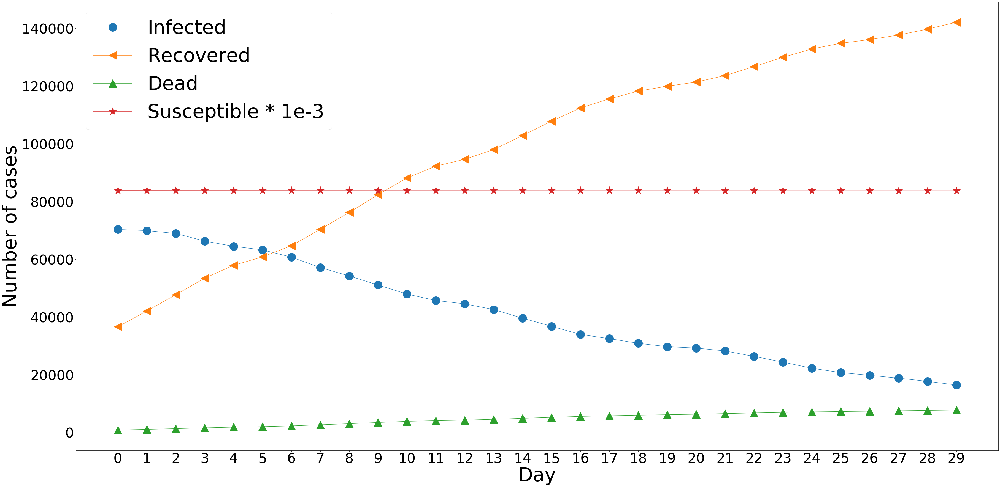

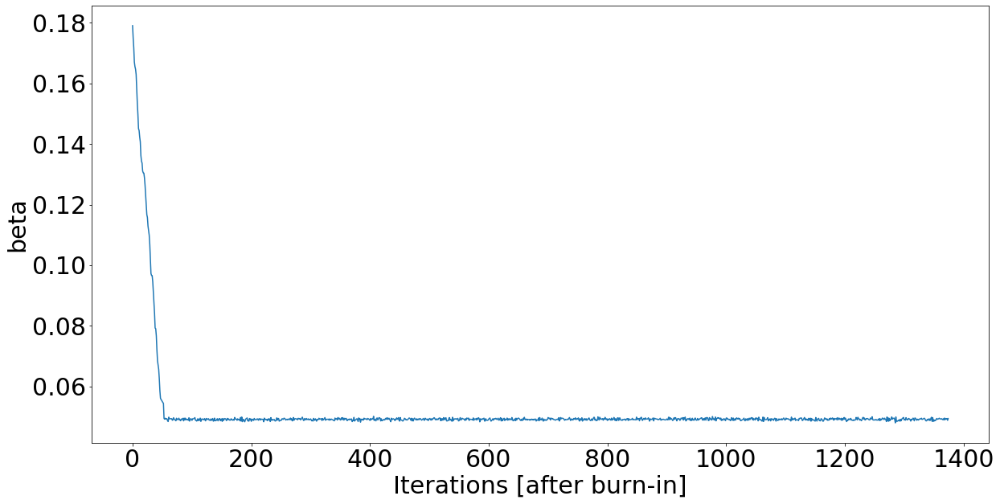

In [17]:
N=83929330
sigma=[1e4,1e4,1e3]
beta_all,gamma_all,beta_all_std,gamma_all_std,alpha_all,alpha_all_std=get_gamma_and_beta_by_time_sampling(S,I,R,D,N,sigma)

In [18]:
beta_ages_method2=[]
gamma_ages_method2=[]


for i in range(S_age.shape[1]):
    beta_age_in,gamma_age_in=get_gamma_and_beta_by_time(S_age[:,i],I_age[:,i],R_age[:,i])
    
    beta_ages_method2.append(beta_age_in)
    gamma_ages_method2.append(gamma_age_in)


/usr/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log
  app.launch_new_instance()
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in double_scalars


/usr/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: overflow encountered in exp
/home/vahid/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/vahid/.local/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/vahid/.local/lib/python3.6/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/vahid/.local/lib/python3.6/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/vahid/.local/lib/python3.6/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


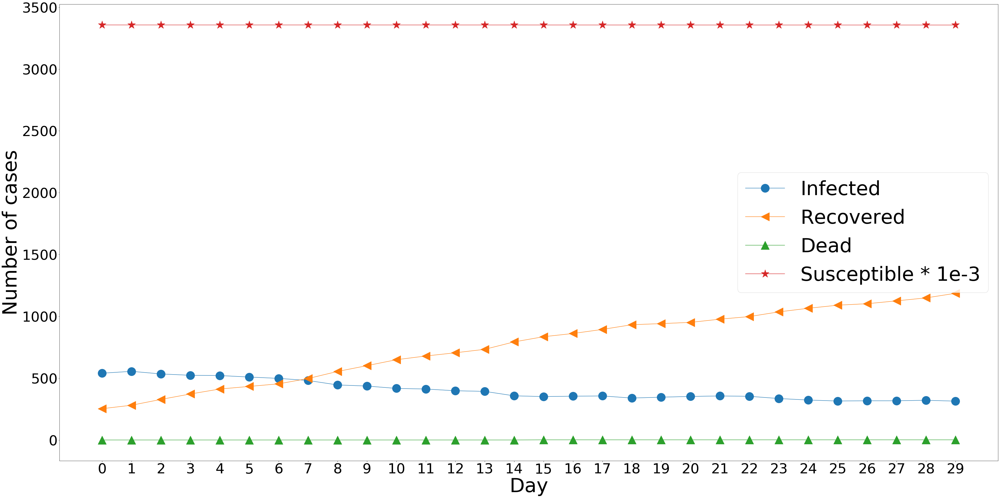

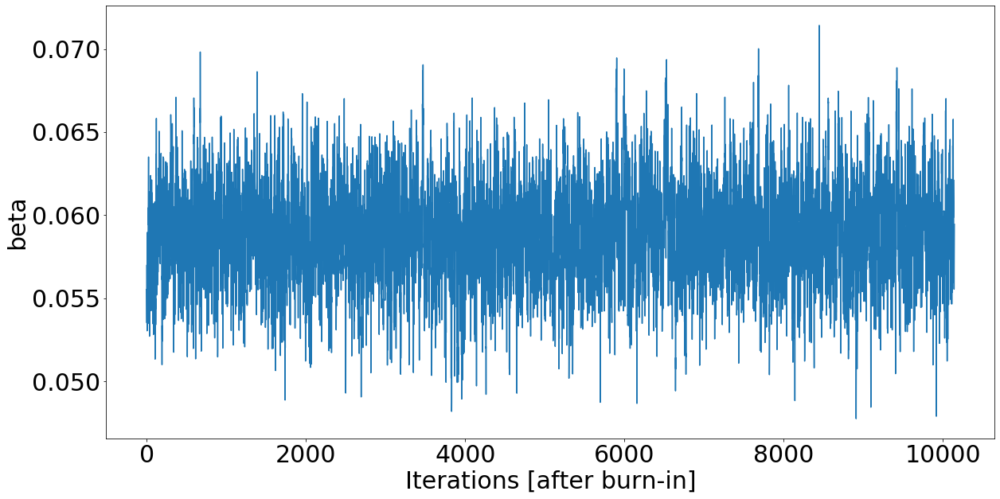

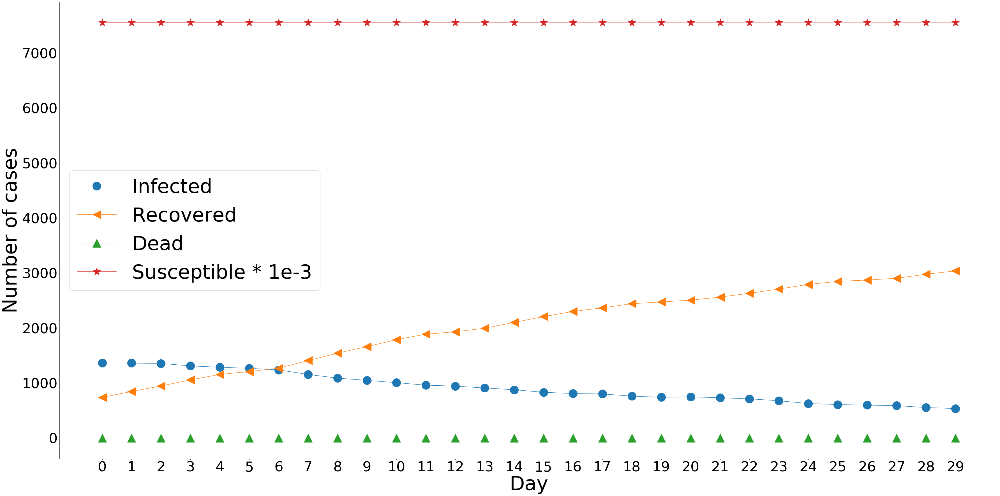

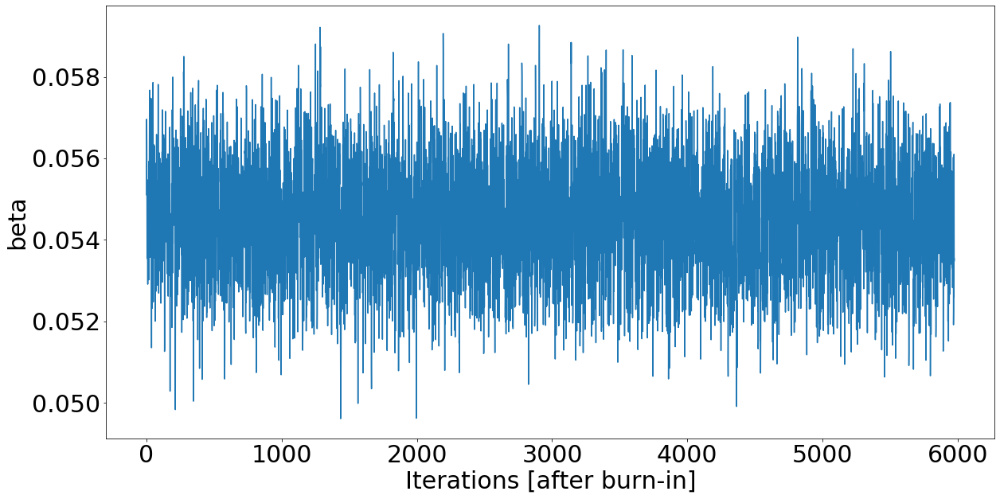

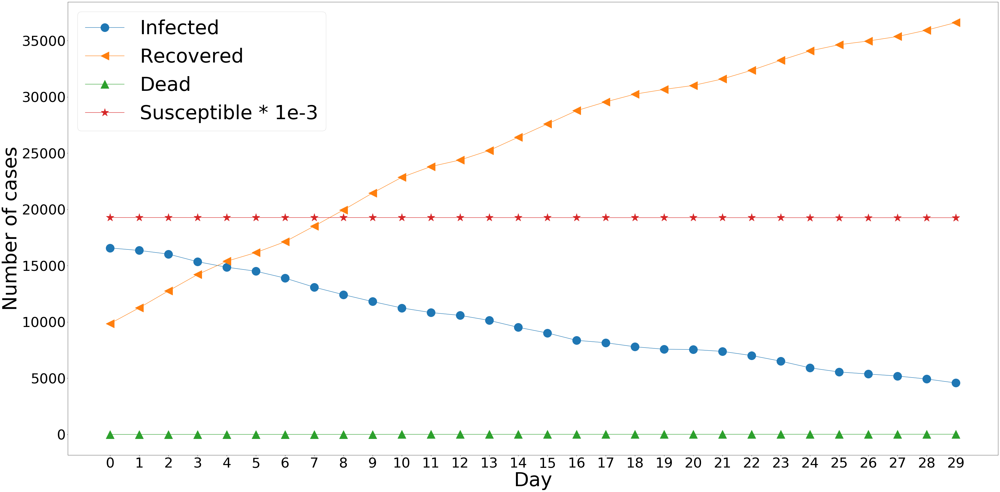

...

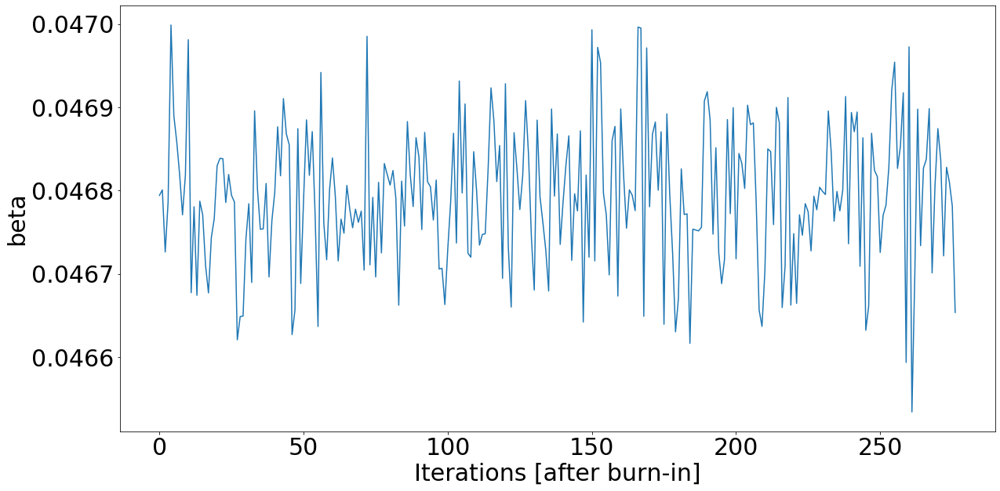

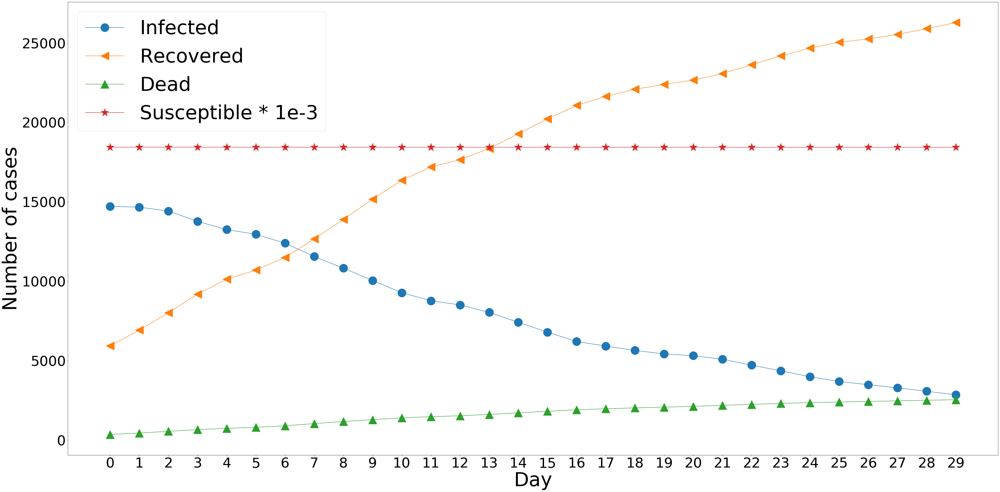

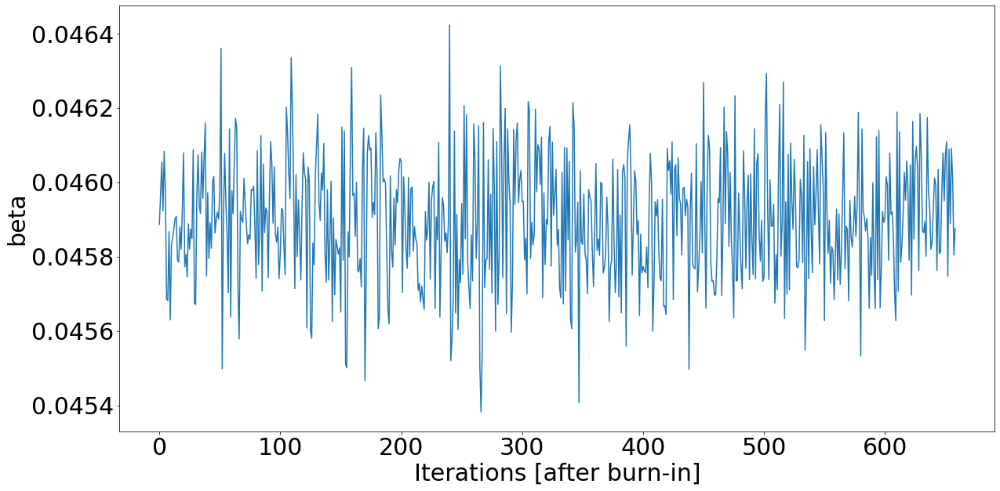

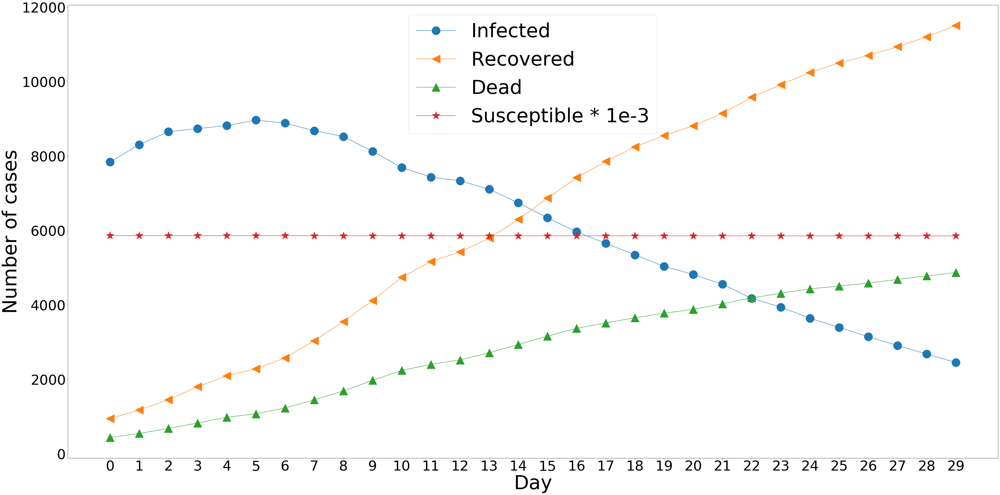

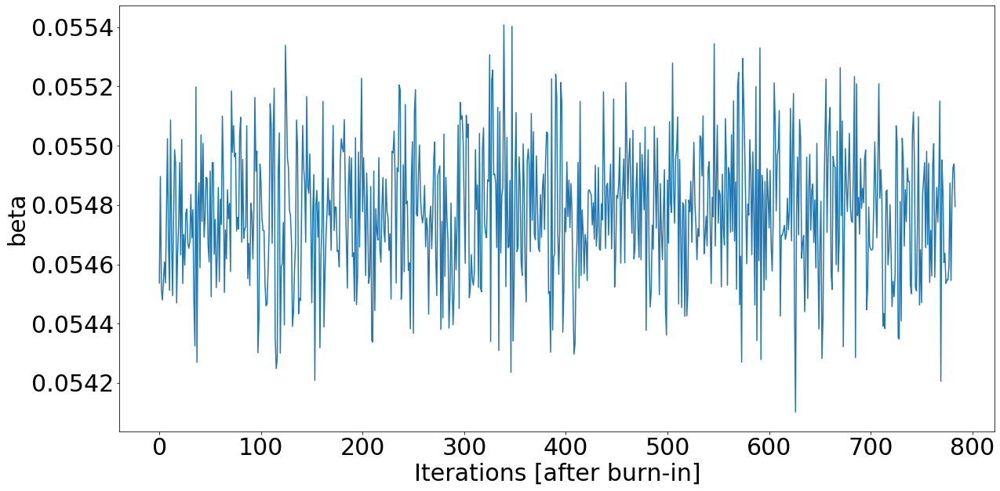

In [19]:
beta_ages=[]
gamma_ages=[]
beta_ages_std=[]
gamma_ages_std=[]
alpha_ages_std=[]
alpha_ages=[]
#sigma=1e2
sigma=[1e2,1e2,1e1]
N_ages=N*np.array(age_rate)
for i in range(S_age.shape[1]):
    beta_age_in,gamma_age_in,beta_age_std_in,gamma_age_std_in,alpha_age_in,alpha_age_std_in=get_gamma_and_beta_by_time_sampling(S_age[:,i],I_age[:,i],R_age[:,i],D_age[:,i],N_ages[i],sigma)
    
    beta_ages.append(beta_age_in)
    gamma_ages.append(gamma_age_in)
    beta_ages_std.append(beta_age_std_in)
    gamma_ages_std.append(gamma_age_std_in)
    alpha_ages.append(10**np.array(alpha_age_in) )
    alpha_ages_std.append(alpha_age_std_in)
    

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: overflow encountered in exp


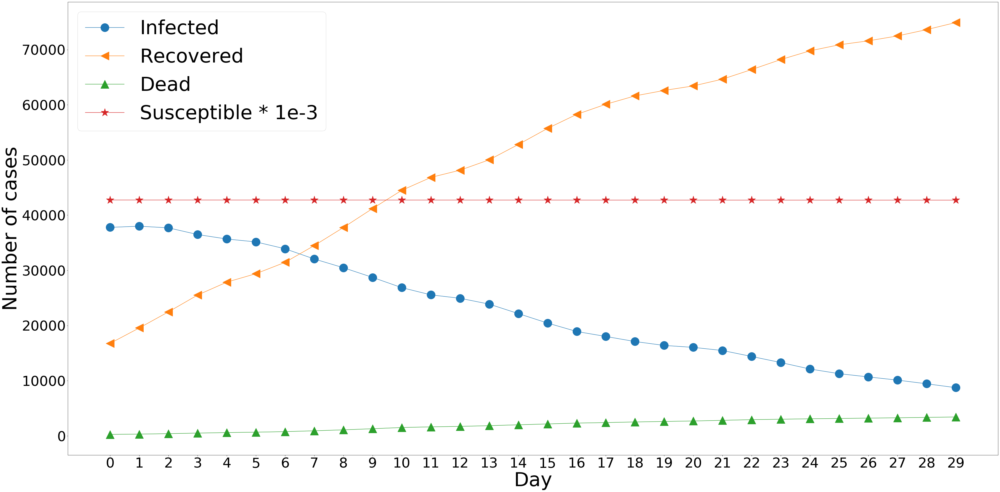

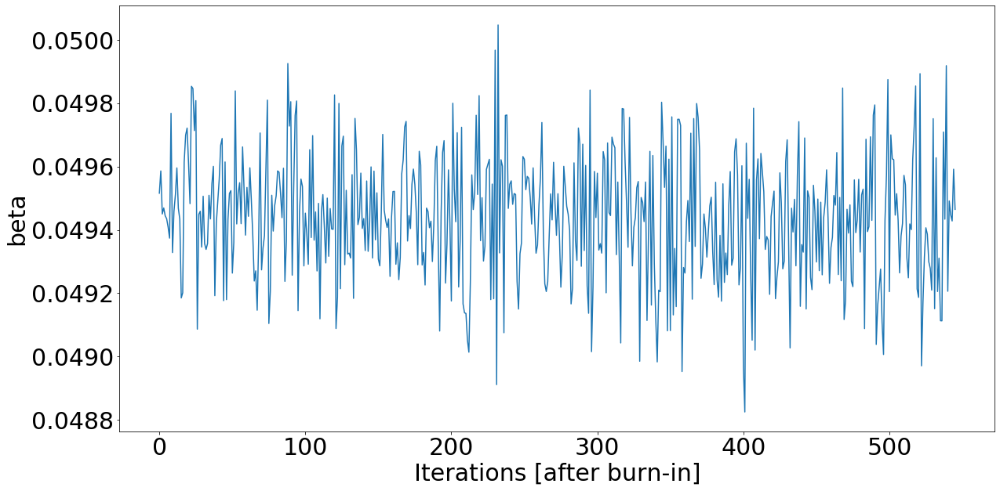

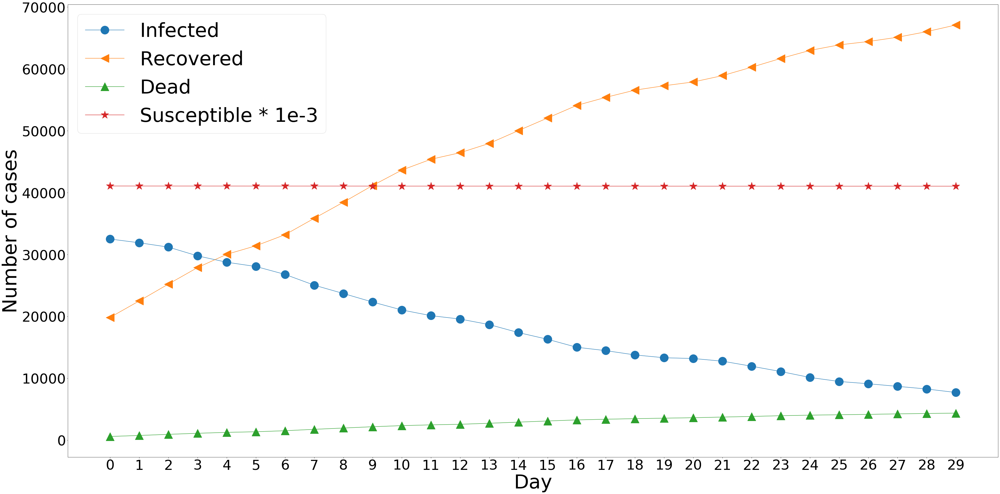

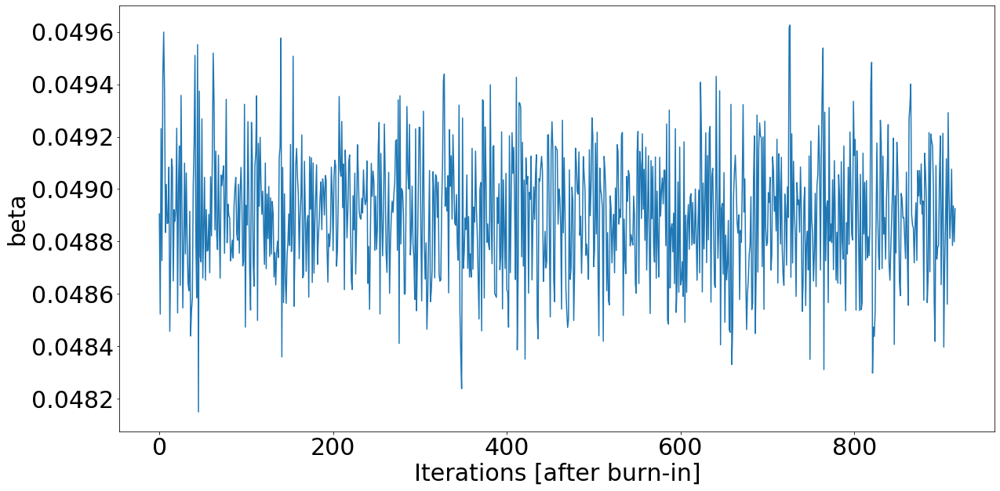

In [20]:
beta_sex=[]
gamma_sex=[]
beta_sex_std=[]
gamma_sex_std=[]
alpha_sex=[]
alpha_sex_std=[]
#sigma=1e3
sigma=[1e3,1e3,1e2]

N_sexes=N*np.array(sex_rate)
for i in range(S_sex.shape[1]):
    beta_age_in,gamma_age_in,beta_age_std_in,gamma_age_std_in,alpha_age_in,alpha_age_std_in=get_gamma_and_beta_by_time_sampling(S_sex[:,i],I_sex[:,i],R_sex[:,i],D_sex[:,i],N_sexes[i],sigma)
    
    beta_sex.append(beta_age_in)
    gamma_sex.append(gamma_age_in)
    beta_sex_std.append(beta_age_std_in)
    gamma_sex_std.append(gamma_age_std_in)
    alpha_sex.append( 10**np.array(alpha_age_in))
    alpha_sex_std.append(alpha_age_std_in)
    

In [21]:
dates=np.copy(melde_dus)
for jj in range(len(melde_dus)):
    if jj%5>0:
        dates[jj]=''
        

In [22]:
R0=(np.array(beta_all))/(np.array(gamma_all)+10**np.array(alpha_all))
R0_ages=(np.array(beta_ages))/(np.array(gamma_ages)+np.array(alpha_ages))
R0_sex=(np.array(beta_sex))/(np.array(gamma_sex)+np.array(alpha_sex))


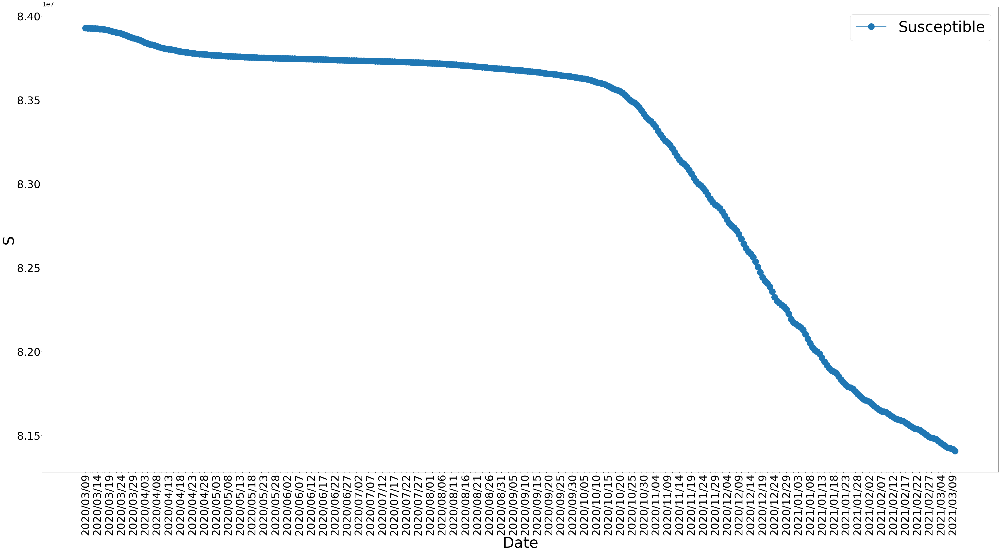

In [23]:
plt.figure(figsize=(80,40))
plt.plot(S,'-o',markersize=30,label='Susceptible')
plt.xticks(np.arange(len(dates[:len(S)])), dates[:len(S)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('S',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Susceptible.png')

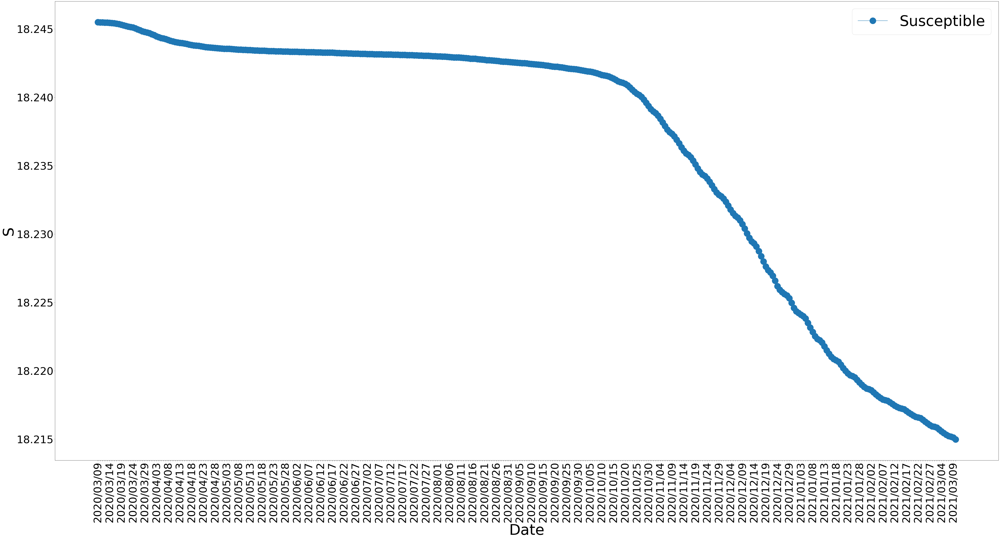

In [24]:
plt.figure(figsize=(80,40))
plt.plot(np.log(S),'-o',markersize=30,label='Susceptible')
plt.xticks(np.arange(len(dates[:len(S)])), dates[:len(S)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('S',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Susceptible.png')

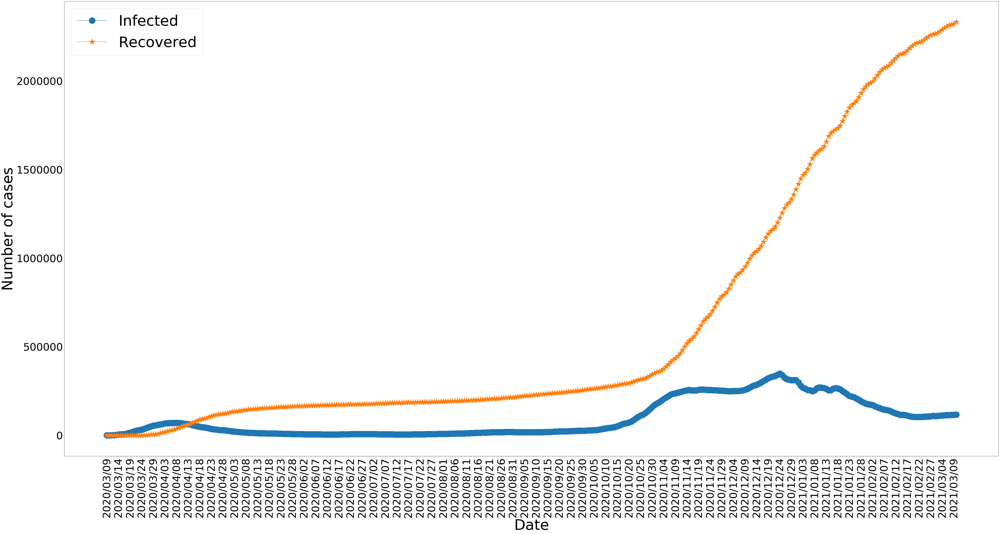

In [25]:
plt.figure(figsize=(80,40))
plt.plot(I,'-o',markersize=30,label='Infected')
plt.plot(R,'-*',markersize=30,label='Recovered')
plt.xticks(np.arange(len(dates[:len(S)])), dates[:len(S)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('Number of cases',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('IR.png')

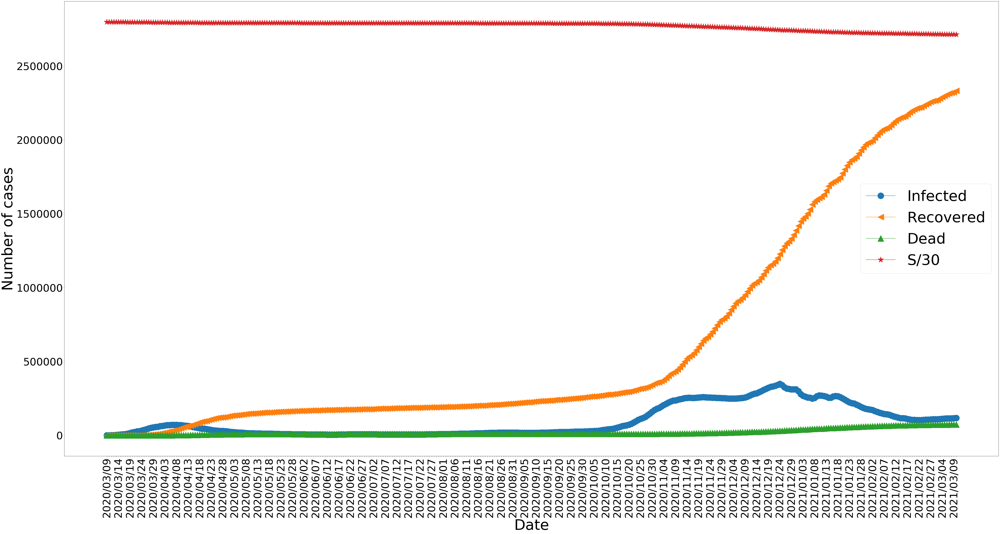

In [26]:
plt.figure(figsize=(80,40))
plt.plot(I,'-o',markersize=30,label='Infected')
plt.plot(R,'-<',markersize=30,label='Recovered')
plt.plot(D,'-^',markersize=30,label='Dead')
plt.plot(S/30.,'-*',markersize=30,label='S/30')
plt.xticks(np.arange(len(dates[:len(S)])), dates[:len(S)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('Number of cases',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('SIRD_tot.png')

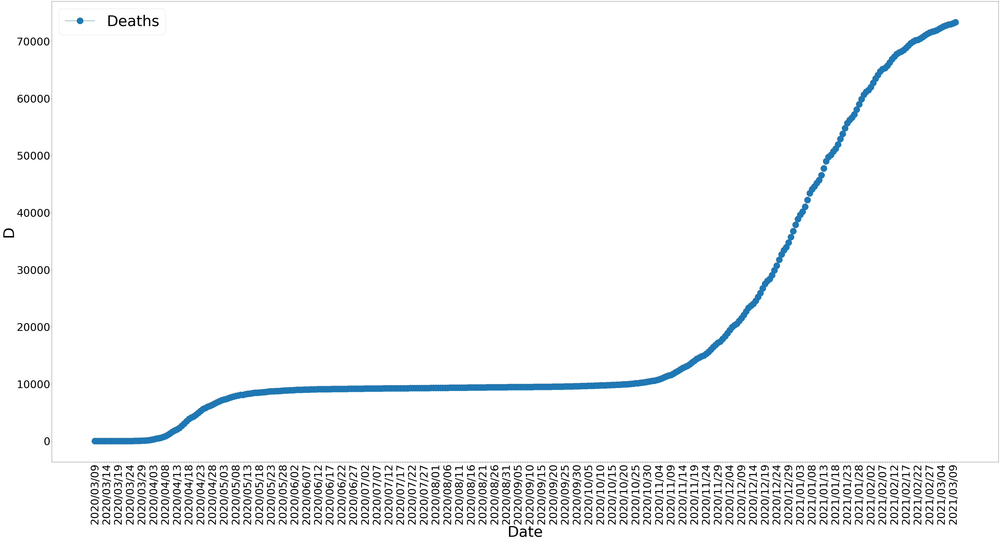

In [27]:
plt.figure(figsize=(80,40))
plt.plot(D,'-o',markersize=30,label='Deaths')
plt.xticks(np.arange(len(dates[:len(S)])), dates[:len(S)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('D',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Deaths.png')

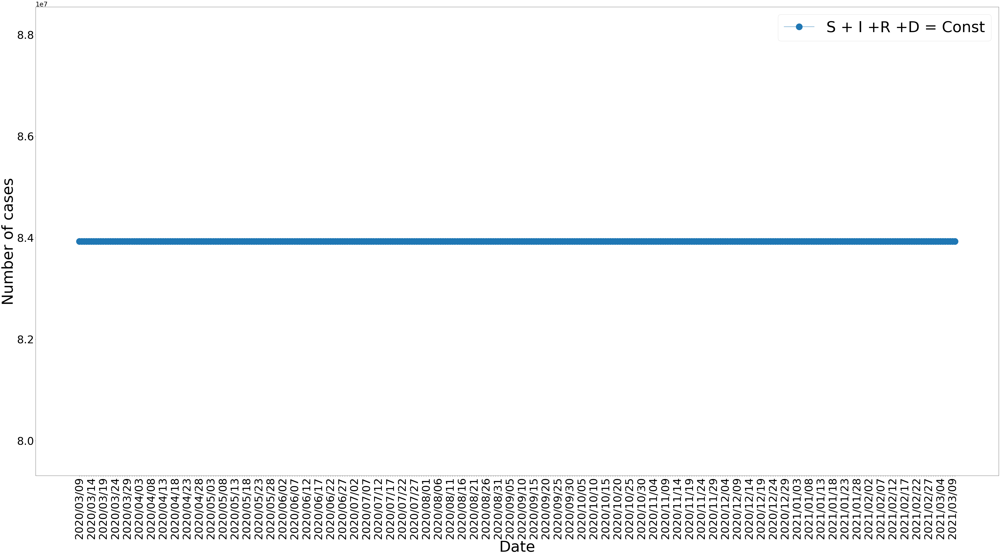

In [28]:


plt.figure(figsize=(80,40))
plt.plot(S +I +R +D ,'-o',markersize=30,label='S + I +R +D = Const')

plt.xticks(np.arange(len(dates[:len(S)])), dates[:len(S)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('Number of cases',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('plus_tot.png')

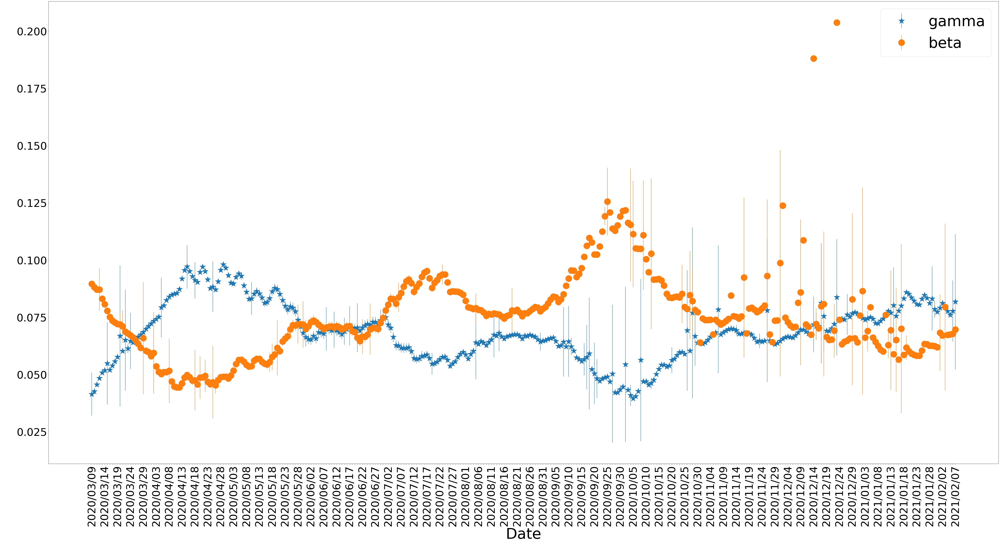

In [29]:
plt.figure(figsize=(80,40))
plt.errorbar(np.array(range(len(gamma_all))),np.array(gamma_all), np.array(gamma_all_std), linestyle='None', marker='*',markersize=30,label='gamma')
plt.errorbar(np.array(range(len(beta_all))),np.array(beta_all), np.array(beta_all_std), linestyle='None', marker='o',markersize=30,label='beta')
plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel(' ',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Gamma_Beta.png')

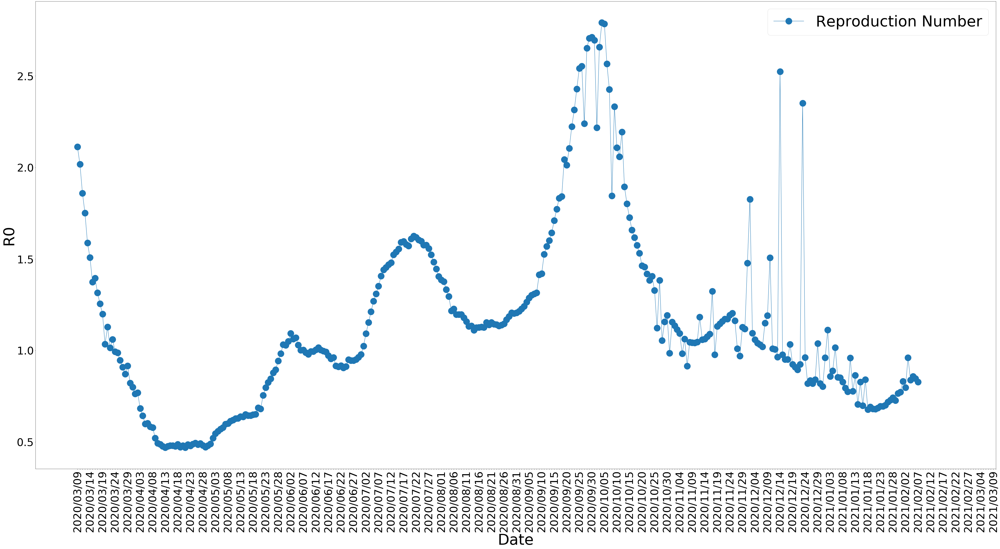

In [30]:
plt.figure(figsize=(80,40))
plt.plot(R0,'-o',markersize=30,label='Reproduction Number')
plt.xticks(np.arange(len(dates[:len(S)])), dates[:len(S)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('R0',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('R0.png')

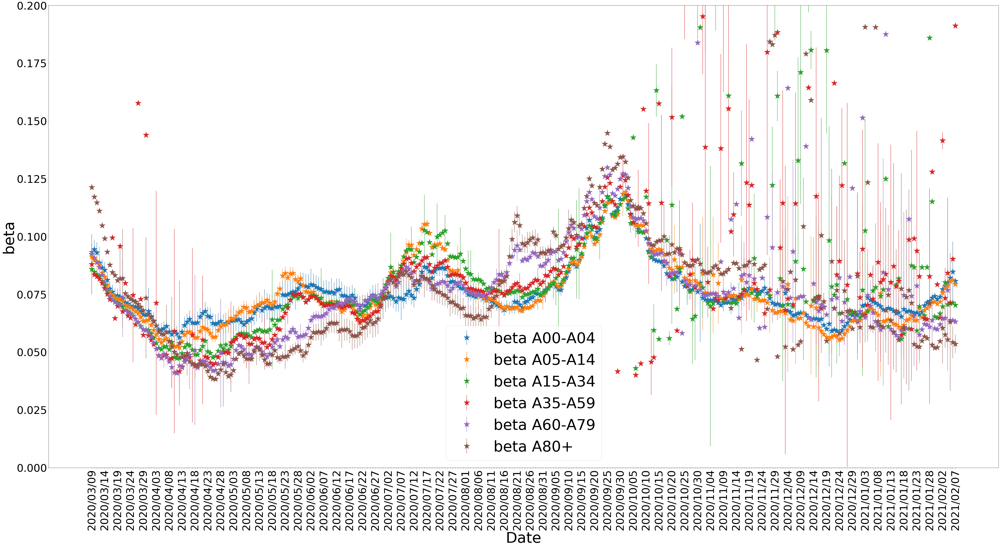

In [31]:

plt.figure(figsize=(80,40))
for i in range(len(beta_ages_method2)):
    plt.errorbar(np.array(range(len(beta_ages_method2[i]))),beta_ages[i],beta_ages_std[i],linestyle='None',  marker='*',markersize=30,label='beta '+age_classes[i])

plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylim([0, 0.2])
plt.ylabel('beta',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Beta_age.png')

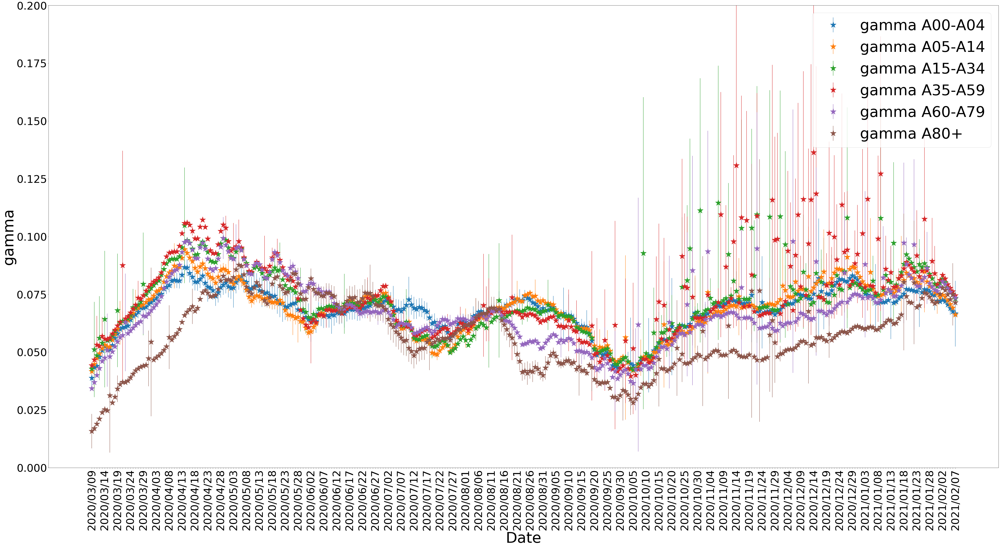

In [32]:

plt.figure(figsize=(80,40))
for i in range(len(beta_ages_method2)):
    plt.errorbar(np.array(range(len(beta_ages_method2[i]))),gamma_ages[i],gamma_ages_std[i],linestyle='None',  marker='*',markersize=30,label='gamma '+age_classes[i])

plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylim([0, 0.2])
plt.ylabel('gamma',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Gamma_age.png')

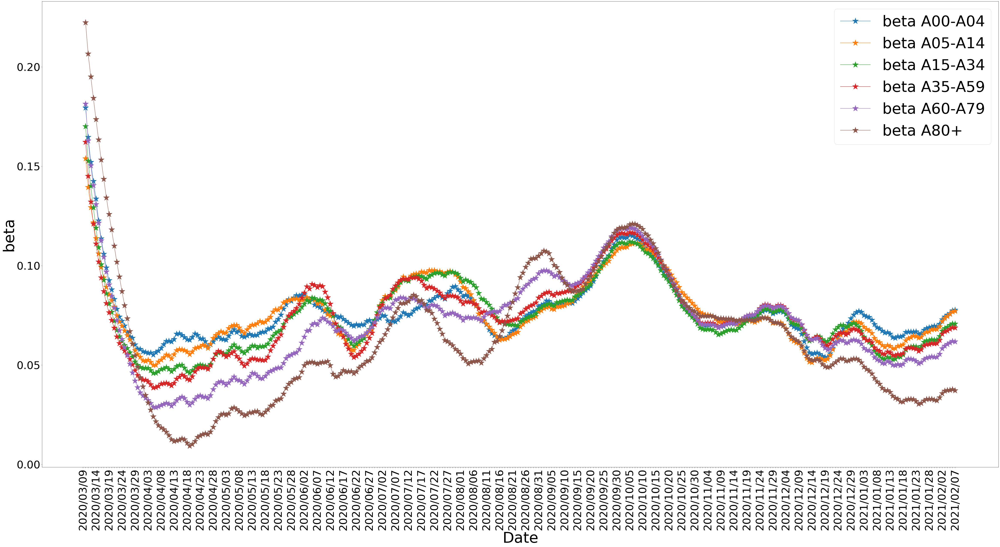

In [33]:

plt.figure(figsize=(80,40))
for i in range(len(beta_ages_method2)):
    plt.plot(np.array(range(len(beta_ages_method2[i]))),beta_ages_method2[i],  marker='*',markersize=30,label='beta '+age_classes[i])

plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('beta',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)

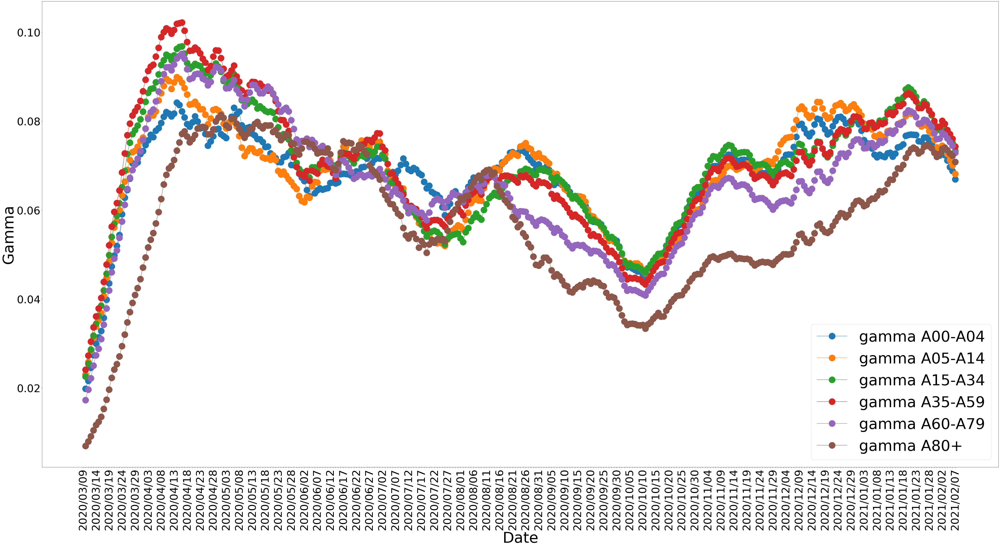

In [34]:
plt.figure(figsize=(80,40))
for i in range(len(gamma_ages_method2)):
    plt.plot(np.array(range(len(gamma_ages_method2[i]))),gamma_ages_method2[i],  marker='o',markersize=30,label='gamma '+age_classes[i])

plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('Gamma',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)

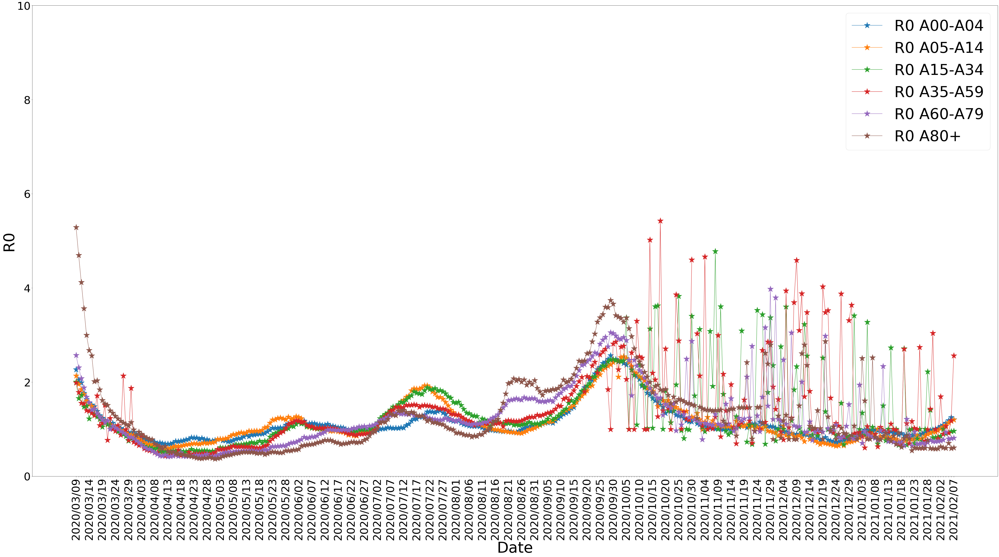

In [35]:
plt.figure(figsize=(80,40))
for i in range(len(beta_ages_method2)):
    plt.plot(np.array(range(len(beta_ages_method2[i]))),R0_ages[i],  marker='*',markersize=30,label='R0 '+age_classes[i])

plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('R0',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.ylim([0, 10])
plt.legend(loc=0,fontsize=70)
plt.savefig('R0_age.png')

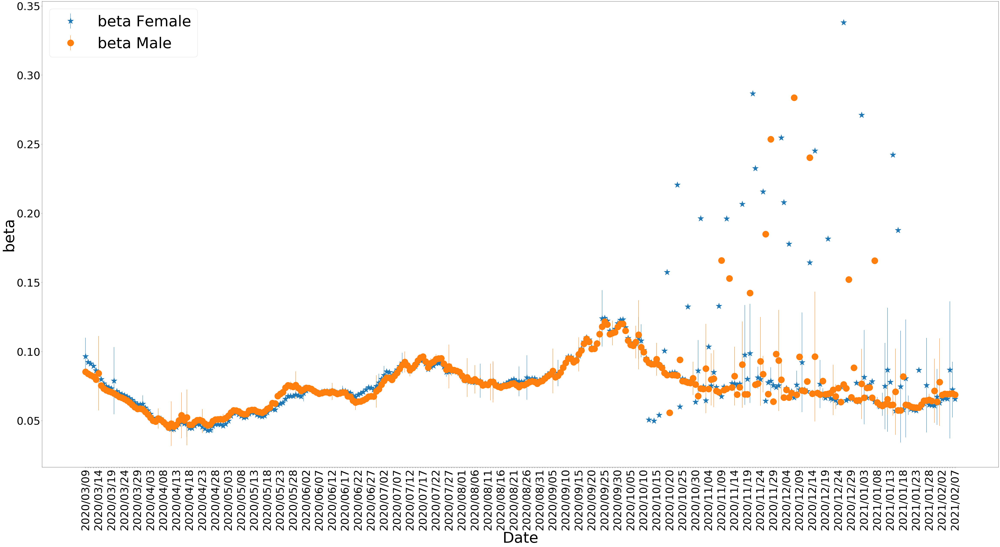

In [36]:
plt.figure(figsize=(80,40))
plt.errorbar(np.array(range(len(beta_sex[0]))),beta_sex[0], beta_sex_std[0], linestyle='None', marker='*',markersize=30,label='beta Female')
plt.errorbar(np.array(range(len(beta_sex[1]))),beta_sex[1], beta_sex_std[1], linestyle='None', marker='o',markersize=30,label='beta Male')
plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('beta',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Beta_Gender.png')

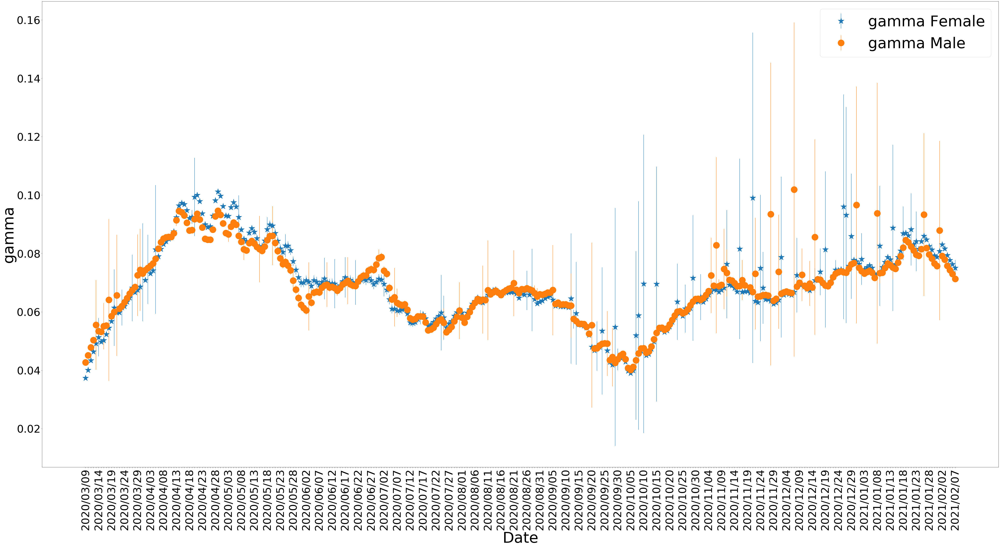

In [37]:
plt.figure(figsize=(80,40))
plt.errorbar(np.array(range(len(gamma_sex[0]))),gamma_sex[0], gamma_sex_std[0], linestyle='None', marker='*',markersize=30,label='gamma Female')
plt.errorbar(np.array(range(len(gamma_sex[1]))),gamma_sex[1], gamma_sex_std[1], linestyle='None', marker='o',markersize=30,label='gamma Male')
plt.xticks(np.arange(len(dates[:len(gamma_all)])), dates[:len(gamma_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('gamma',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Gamma_Gender.png')

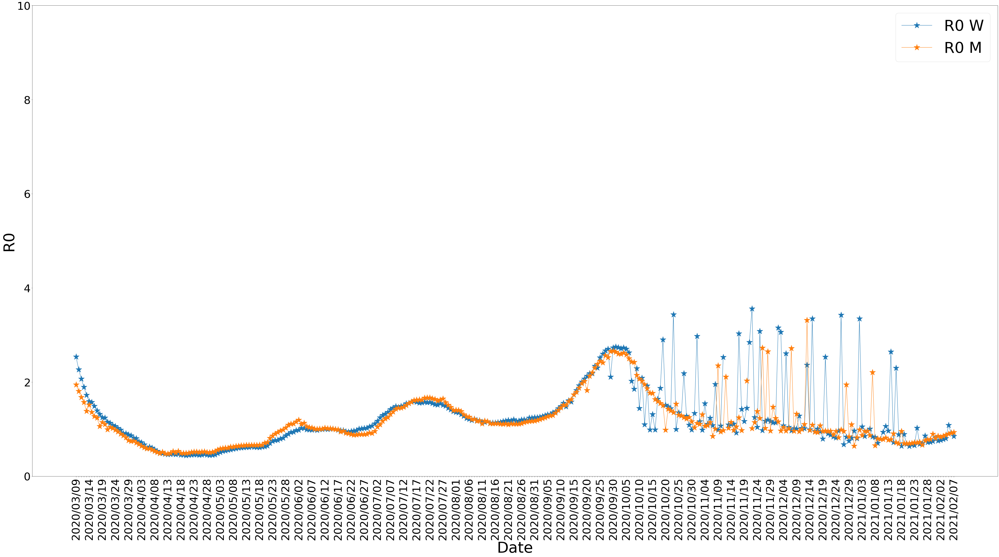

In [38]:
plt.figure(figsize=(80,40))
for i in range(len(beta_sex)):
    plt.plot(np.array(range(len(beta_ages_method2[i]))),R0_sex[i],  marker='*',markersize=30,label='R0 '+sex_classes[i])

plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('R0',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.ylim([0, 10])
plt.legend(loc=0,fontsize=70)
plt.savefig('R0_Gender.png')

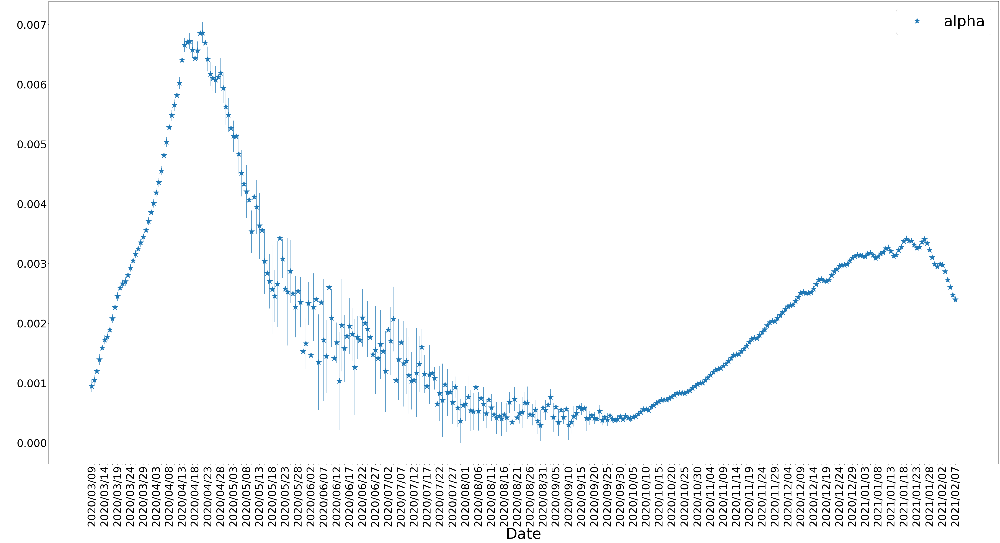

In [39]:
plt.figure(figsize=(80,40))
plt.errorbar(np.array(range(len(gamma_all))),10**np.array(alpha_all), np.array(alpha_all_std), linestyle='None', marker='*',markersize=30,label='alpha')
plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel(' ',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Alpha.png')

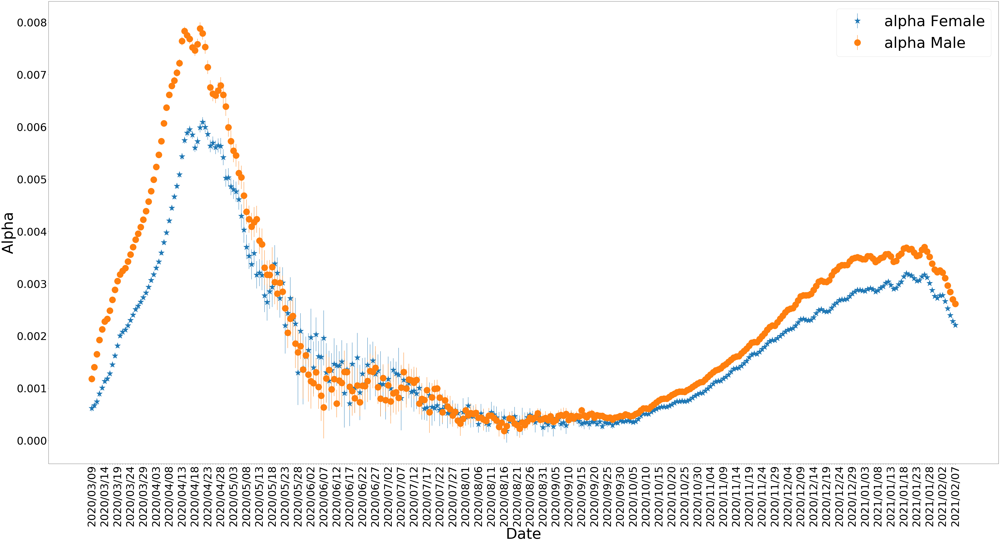

In [40]:
plt.figure(figsize=(80,40))
plt.rcParams["font.size"] = "40"
plt.errorbar(np.array(range(len(gamma_sex[0]))),alpha_sex[0], alpha_sex_std[0], linestyle='None', marker='*',markersize=30,label='alpha Female')
plt.errorbar(np.array(range(len(gamma_sex[1]))),alpha_sex[1], alpha_sex_std[1], linestyle='None', marker='o',markersize=30,label='alpha Male')
plt.xticks(np.arange(len(dates[:len(gamma_all)])), dates[:len(gamma_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('Alpha',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Gamma_Gender.png')

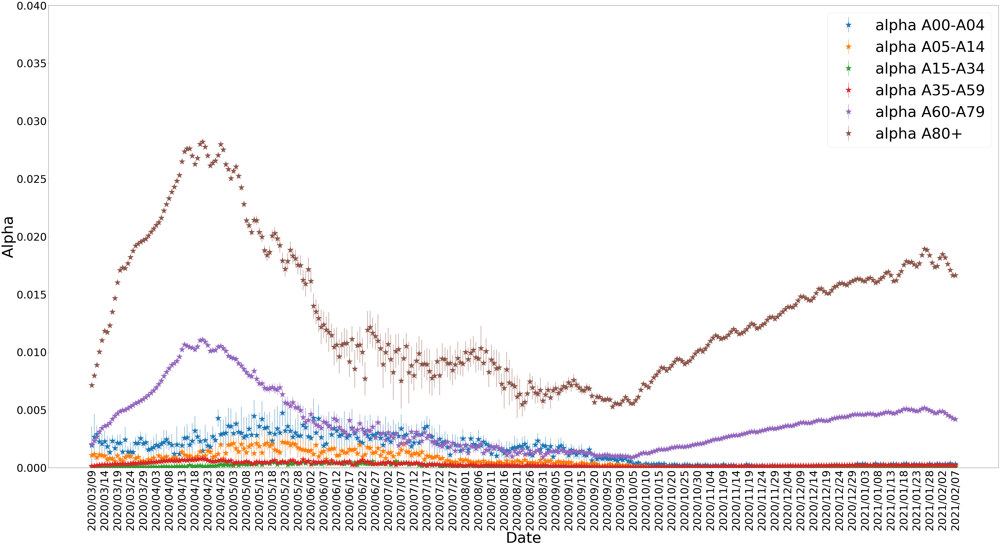

In [41]:
plt.figure(figsize=(80,40))
for i in range(len(beta_ages_method2)):
    plt.errorbar(np.array(range(len(beta_ages_method2[i]))),alpha_ages[i],alpha_ages_std[i],linestyle='None',  marker='*',markersize=30,label='alpha '+age_classes[i])

plt.xticks(np.arange(len(dates[:len(beta_all)])), dates[:len(beta_all)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylim([0, 0.04])
plt.ylabel('Alpha',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)
plt.savefig('Beta_age.png')

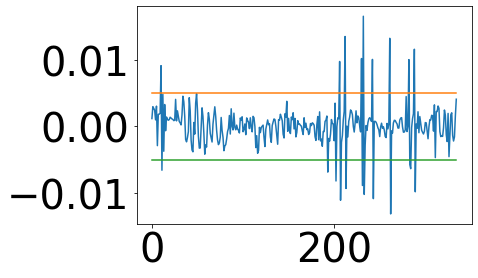

In [172]:
plt.plot( np.diff( gamma_all))
plt.plot(np.zeros( len(np.diff( gamma_all)))+0.005)
plt.plot(np.zeros( len(np.diff( gamma_all)))-0.005)

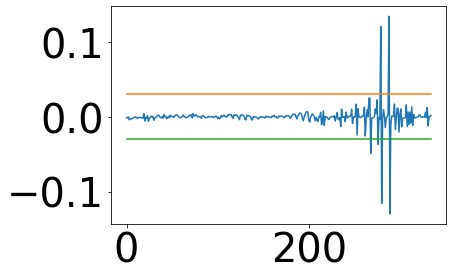

In [181]:
plt.plot( np.diff( beta_all))
plt.plot(np.zeros( len(np.diff( beta_all)))+0.03)
plt.plot(np.zeros( len(np.diff( beta_all)))-0.03)

In [184]:
diff_lim_gamma = 0.005
diff_gamma_all  = np.diff( gamma_all)

diff_lim_beta = 0.03
diff_beta_all  = np.diff( beta_all)

In [185]:



gamma_all_new = []

for i in range(len(diff_gamma_all)-1):
    #print(abs(diff_gamma_all[i]),abs(diff_gamma_all[i+1]) )
    if abs( diff_gamma_all[i]) >= diff_lim_gamma and abs( diff_gamma_all[i+1]) >= diff_lim_gamma:
        #print('bura galir')
        #print(gamma_all[i-1],gamma_all[i],gamma_all[i+1] ,gamma_all[i+2])
        gamma_all_new.append(np.mean( [  gamma_all[i] ,gamma_all[i+2] ] ))
    elif abs( diff_gamma_all[i]) >= diff_lim_gamma and abs( diff_gamma_all[i+1]) < diff_lim_gamma:
        gamma_all_new.append(gamma_all[i+1])
    elif abs( diff_gamma_all[i]) < diff_lim_gamma and abs( diff_gamma_all[i+1]) >= diff_lim_gamma:
        gamma_all_new.append(gamma_all[i+1])
    else:
        #print(gamma_all[i+1],'yazilir')
        gamma_all_new.append(gamma_all[i+1] )
        
    

In [186]:


beta_all_new = []

for i in range(len(diff_beta_all)-1):
    #print(abs(diff_gamma_all[i]),abs(diff_gamma_all[i+1]) )
    if abs( diff_beta_all[i]) >= diff_lim_beta and abs( diff_beta_all[i+1]) >= diff_lim_beta:
        #print('bura galir')
        #print(gamma_all[i-1],gamma_all[i],gamma_all[i+1] ,gamma_all[i+2])
        beta_all_new.append(np.mean( [  beta_all[i] ,beta_all[i+2] ] ))
    elif abs( diff_beta_all[i]) >= diff_lim_beta and abs( diff_beta_all[i+1]) < diff_lim_beta:
        beta_all_new.append(beta_all[i+1])
    elif abs( diff_beta_all[i]) < diff_lim_beta and abs( diff_beta_all[i+1]) >= diff_lim_beta:
        beta_all_new.append(beta_all[i+1])
    else:
        #print(gamma_all[i+1],'yazilir')
        beta_all_new.append(beta_all[i+1] )

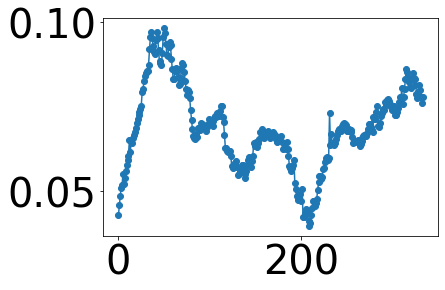

In [188]:
#plt.figure(figsize=(30,30))
plt.plot(gamma_all_new,'-o')
#plt.plot(gamma_all,'o')

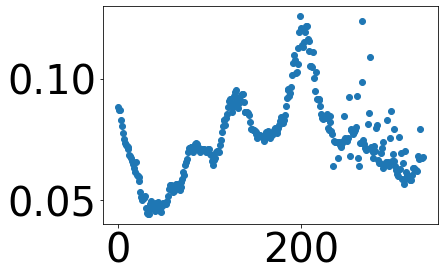

In [189]:
plt.plot(beta_all_new,'o')

In [190]:
N=83929330.00


In [192]:
def calculate_forward_model(S, I, R, D, beta_all, gamma_all_new, alpha_all ,index_start):
    I0 = []
    S0 = []
    R0 = []
    D0 = []

    
    I0.append(I[index_start])
    S0.append(S[index_start])
    R0.append(R[index_start])
    D0.append(D[index_start])

    S_forward = []
    I_forward = []
    R_forward = []
    D_forward = []


    for ii in range(index_start+1,len(gamma_all_new)):
        S_next = -(beta_all[ii]*S0[0]*I0[0])/N +S0[0]
        I_next = (beta_all[ii]*S0[0]*I0[0])/N - (10**np.array(alpha_all[ii])+gamma_all_new[ii])*I0[0] + I0[0]
        R_next = gamma_all_new[ii]*I0[0] + R0[0]
        D_next = 10**np.array(alpha_all[ii])*I0[0] + D0[0]
        S0[0] = S_next
        I0[0] = I_next
        R0[0] = R_next
        D0[0] = D_next

        S_forward.append(S_next)
        I_forward.append(I_next)
        R_forward.append(R_next)
        D_forward.append(D_next)
    return S_forward, I_forward, R_forward, D_forward


In [194]:
index_start = 20
S_forward, I_forward, R_forward, D_forward = calculate_forward_model(S, I, R, D, beta_all_new, gamma_all_new, alpha_all ,index_start)

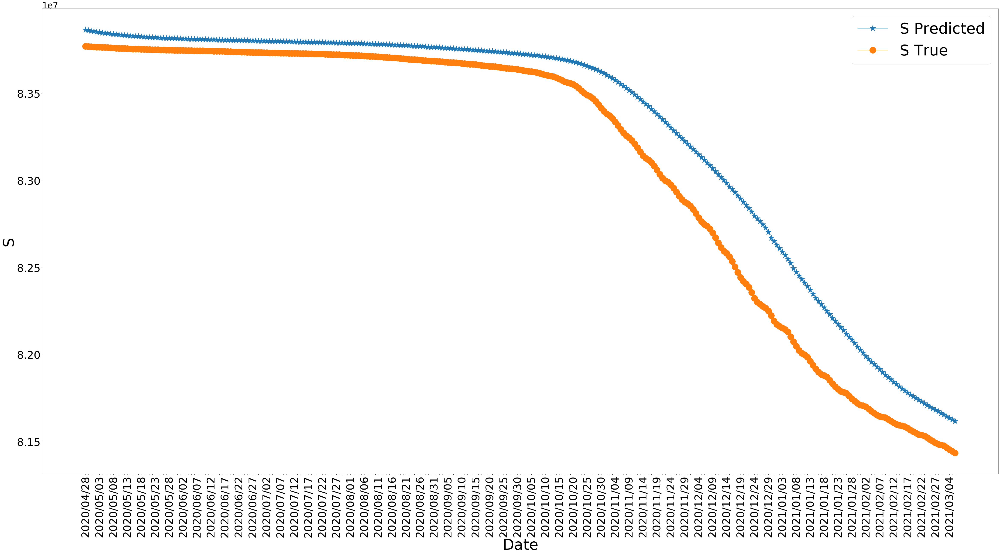

In [203]:

plt.figure(figsize=(80,40))

plt.plot(np.array(range(len(S_forward))),S_forward,  marker='*',markersize=30,label='S Predicted')
plt.plot(np.array(range(len(S_forward))),S[index_start+30:index_start+30+len(S_forward)],  marker='o',markersize=30,label='S True')

plt.xticks(np.arange(len(dates[index_start+30:index_start+30+len(S_forward)])), 
           dates[index_start+30:index_start+30+len(S_forward)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('S',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)

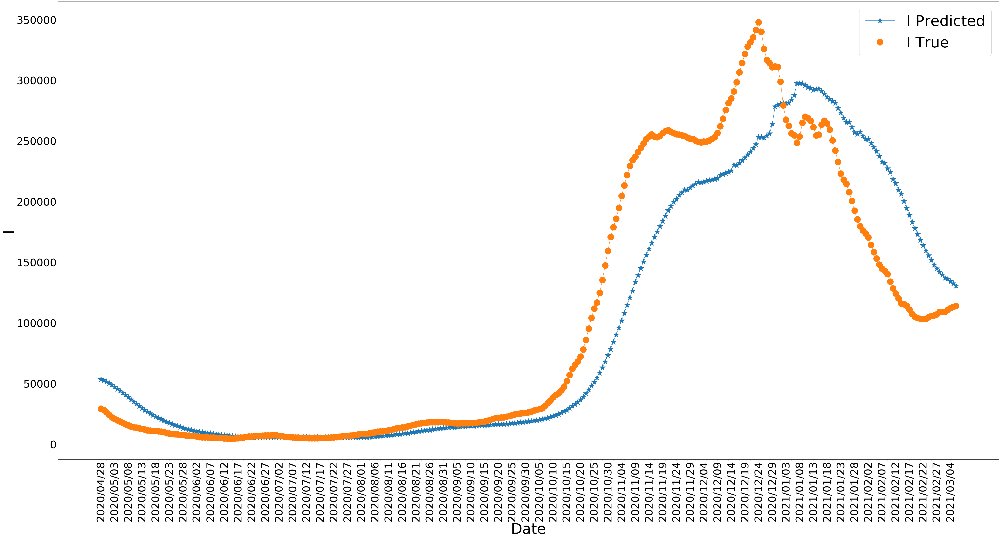

In [204]:

plt.figure(figsize=(80,40))

plt.plot(np.array(range(len(S_forward))),I_forward,  marker='*',markersize=30,label='I Predicted')
plt.plot(np.array(range(len(S_forward))),I[index_start+30:index_start+30+len(S_forward)],
         marker='o',markersize=30,label='I True')

plt.xticks(np.arange(len(dates[index_start+30:index_start+30+len(S_forward)])), 
           dates[index_start+30:index_start+30+len(S_forward)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('I',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)

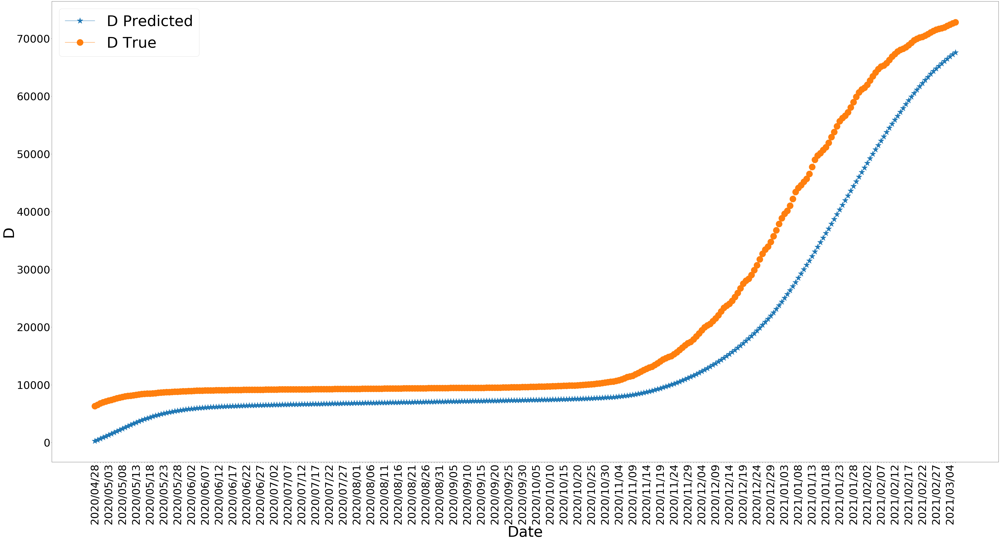

In [205]:
plt.figure(figsize=(80,40))

plt.plot(np.array(range(len(S_forward))),D_forward,  marker='*',markersize=30,label='D Predicted')
plt.plot(np.array(range(len(S_forward))),D[index_start+30:index_start+30+len(S_forward)],
         marker='o',markersize=30,label='D True')

plt.xticks(np.arange(len(dates[index_start+30:index_start+30+len(S_forward)])), 
           dates[index_start+30:index_start+30+len(S_forward)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('D',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)

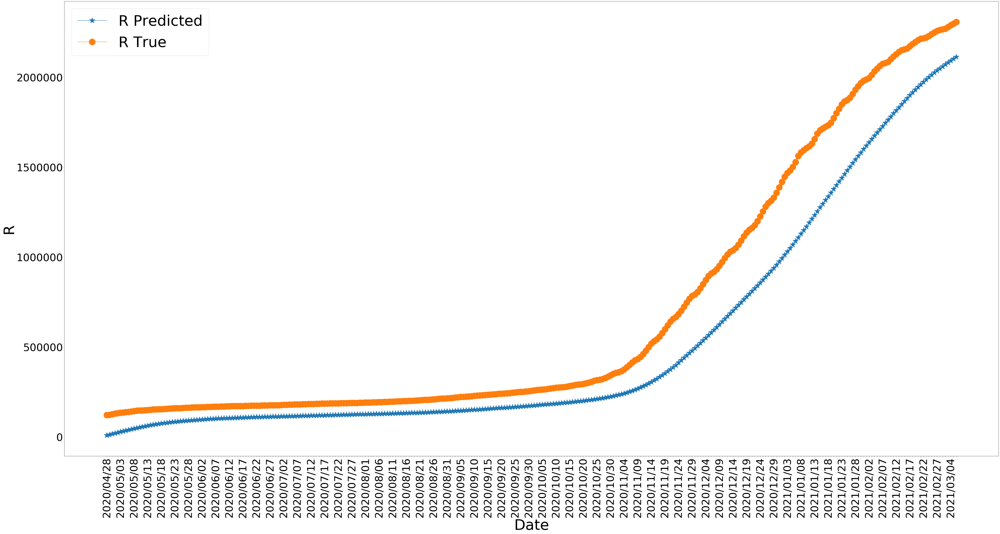

In [206]:
plt.figure(figsize=(80,40))

plt.plot(np.array(range(len(S_forward))),R_forward,  marker='*',markersize=30,label='R Predicted')
plt.plot(np.array(range(len(S_forward))),R[index_start+30:index_start+30+len(S_forward)],
         marker='o',markersize=30,label='R True')

plt.xticks(np.arange(len(dates[index_start+30:index_start+30+len(S_forward)])), 
           dates[index_start+30:index_start+30+len(S_forward)],rotation=90,fontsize=50)
plt.yticks(fontsize=50)
plt.ylabel('R',fontsize=70)
plt.xlabel('Date',fontsize=70)
plt.legend(loc=0,fontsize=70)